In [1]:
# We import the packages along with other useful libraries.
%matplotlib inline
import astropy.units as u
import astropy.io.fits as fits
import numpy as np
from matplotlib.pyplot import *
from matplotlib import pyplot as plt
import vip_hci as vip
from hciplot import plot_frames, plot_cubes
import pyds9 as sao

In [2]:
# We import all the routines that will be used in this code.
from packaging import version
vvip = vip.__version__
print("VIP version: ", vvip)
if version.parse(vvip) < version.parse("1.0.0"):
    msg = "Please upgrade your version of VIP"
    msg+= "It should be 1.0.0 or above to run this notebook."
    raise ValueError(msg)
elif version.parse(vvip) <= version.parse("1.0.3"):
    from vip_hci.conf import VLT_NACO
    from vip_hci.medsub import median_sub
    from vip_hci.metrics import normalize_psf
    from vip_hci.negfc import (confidence, firstguess, mcmc_negfc_sampling, show_corner_plot, show_walk_plot,
                               speckle_noise_uncertainty)
    from vip_hci.pca import pca, pca_annular, pca_grid
else:
    from vip_hci.config import VLT_NACO
    from vip_hci.fm import normalize_psf, cube_inject_companions, firstguess
    from vip_hci.psfsub import median_sub, pca, pca_annular, pca_grid

# common to all versions:
from vip_hci.fits import open_fits, write_fits, info_fits
from vip_hci.metrics import significance, snr, snrmap, contrast_curve, detection, throughput 
from vip_hci.var import fit_2dgaussian, frame_center
from vip_hci.preproc import (approx_stellar_position, cube_correct_nan, cube_crop_frames,
                             cube_detect_badfr_correlation, cube_fix_badpix_annuli,
                             cube_fix_badpix_clump, cube_fix_badpix_isolated,
                             cube_px_resampling, cube_recenter_2dfit, cube_recenter_dft_upsampling,
                             cube_recenter_satspots, cube_recenter_via_speckles, cube_shift,
                             frame_center_radon, frame_crop, frame_fix_badpix_isolated, frame_shift)

VIP version:  1.4.0


In [3]:
# Let's define the pixel scale for SPHERE (IRDIS)
mas = 12.25 * u.mas
pxscale_sphere = mas.to(u.arcsec)/u.arcsec
pxscale_sphere

<Quantity 0.01225>

1 mas = 1/1000 arcsecond

## Loading and visualizing the data

In [4]:
# Let’s first inspect the fits file
info_fits('/home/cvargas/sphere/AS209/HIP 82323_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305262/ird_convert_recenter_dc2021-IRD_SCIENCE_REDUCED_MASTER_CUBE-center_im.fits')

Filename: /home/cvargas/sphere/AS209/HIP 82323_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305262/ird_convert_recenter_dc2021-IRD_SCIENCE_REDUCED_MASTER_CUBE-center_im.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1042   (1024, 1024, 32, 2)   float32   


In [5]:
# Now we load all the data in memory with the open_fits function
cubename = '/home/cvargas/sphere/AS209/HIP 82323_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305262/ird_convert_recenter_dc2021-IRD_SCIENCE_REDUCED_MASTER_CUBE-center_im.fits'
psfname = '/home/cvargas/sphere/AS209/HIP 82323_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305262/ird_convert_recenter_dc2021-IRD_SCIENCE_PSF_MASTER_CUBE-median_unsat.fits'
anglename = '/home/cvargas/sphere/AS209/HIP 82323_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305262/ird_convert_recenter_dc2021-IRD_SCIENCE_PARA_ROTATION_CUBE-rotnth.fits'

cube = open_fits(cubename)
psf = open_fits(psfname)
angle = open_fits(anglename)

Fits HDU-0 data successfully loaded. Data shape: (2, 32, 1024, 1024)
Fits HDU-0 data successfully loaded. Data shape: (2, 5, 64, 64)
Fits HDU-0 data successfully loaded. Data shape: (32,)


In [6]:
cubee = fits.open(cubename)
cubee[0].header

SIMPLE  =                    T / Written by IDL:  Mon Jan 17 10:52:06 2022      
BITPIX  =                  -32 / IEEE single precision floating point           
NAXIS   =                    4 / number of data axes                            
NAXIS1  =                 1024 /Number of positions along axis 1                
NAXIS2  =                 1024 /Number of positions along axis 2                
NAXIS3  =                   32 /Number of positions along axis 3                
NAXIS4  =                    2 /Number of positions along axis 4                
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
DATE    = '2022-01-17T09:42:56' / file creation date (YYYY-MM-DDThh:mm:ss UT)   
ORIGIN  = 'ESO-PARANAL'        / European Southern Observatory                  
TELESCOP= 'ESO-VLT-U3'      

In [11]:
# Let's see the parallactic angles
angle

array([-20.327301  , -20.218826  , -20.096222  , -19.982513  ,
       -19.854256  , -19.735107  , -19.600746  , -19.475891  ,
       -17.175224  , -16.995262  , -16.79512   , -16.606415  ,
       -16.393845  , -16.195816  , -15.975601  , -15.767822  ,
       -10.924171  , -10.593399  , -10.21962   ,  -9.871208  ,
        -9.482689  ,  -9.115486  ,  -8.699844  ,  -8.312508  ,
        -1.5937805 ,  -1.017273  ,  -0.36183167,   0.24732971,
         0.9362793 ,   1.5805054 ,   2.2996979 ,   2.9806824 ],
      dtype=float32)

New shape: (2, 32, 100, 100)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Dataset   [x,y,time,lambda]   (flux)
:Cube_shape	[100, 100, 32, 2]


:HoloMap   [time,lambda]
   :Image   [x,y]   (flux)
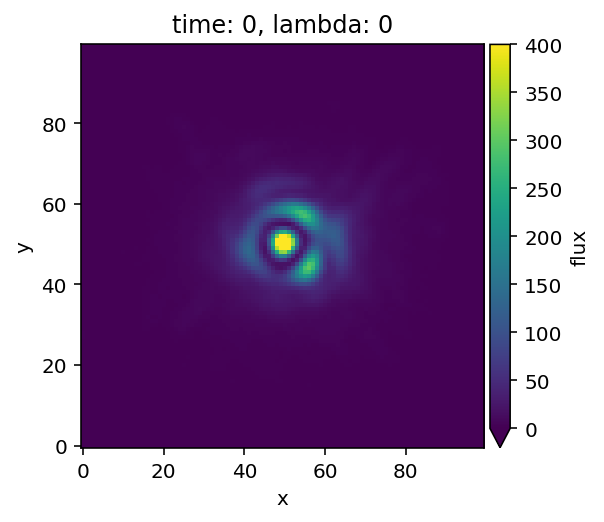
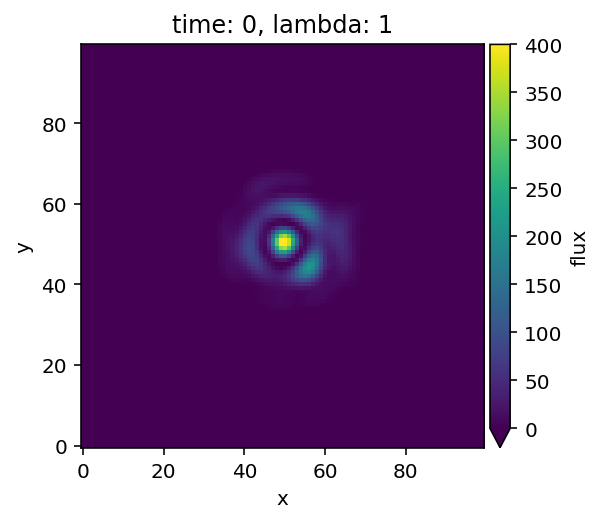
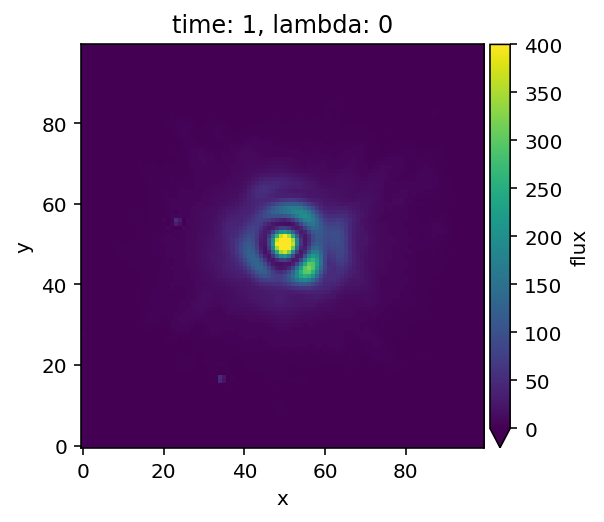
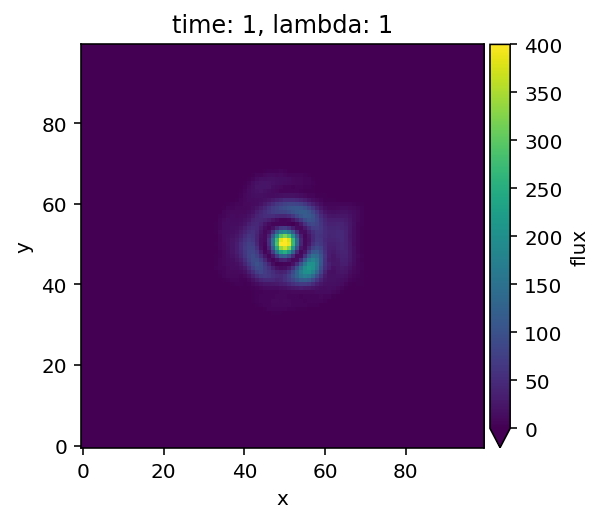
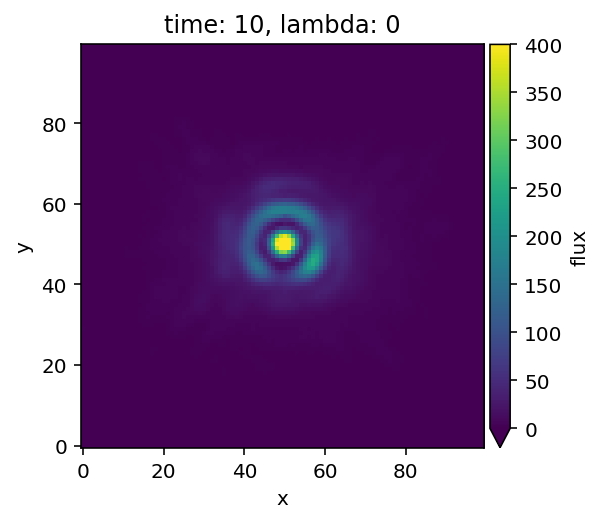
...
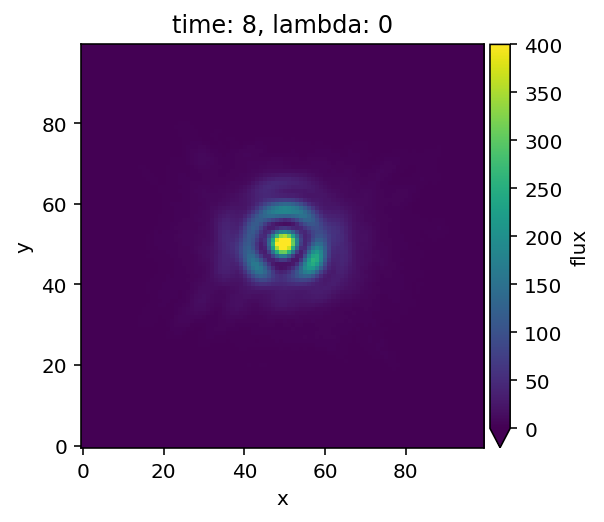
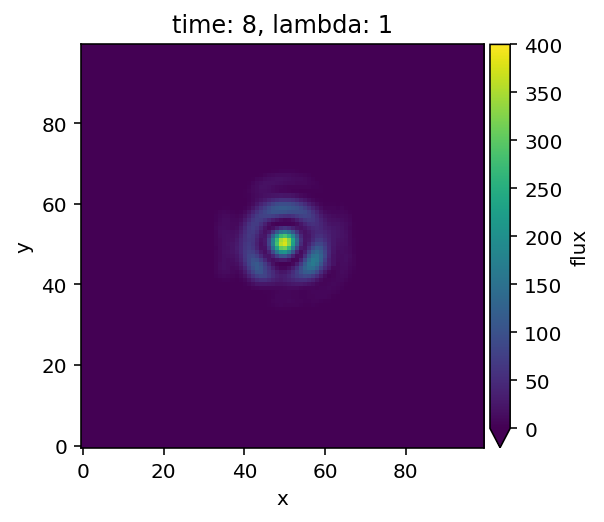
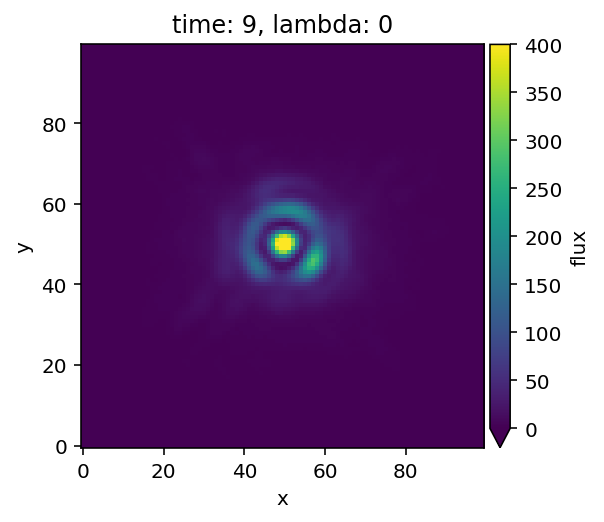
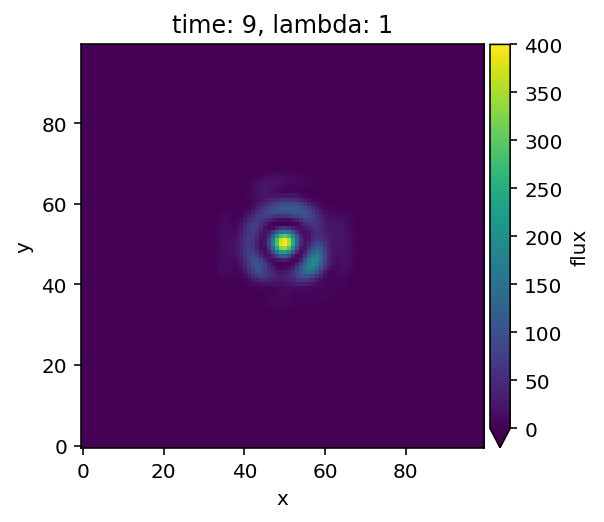
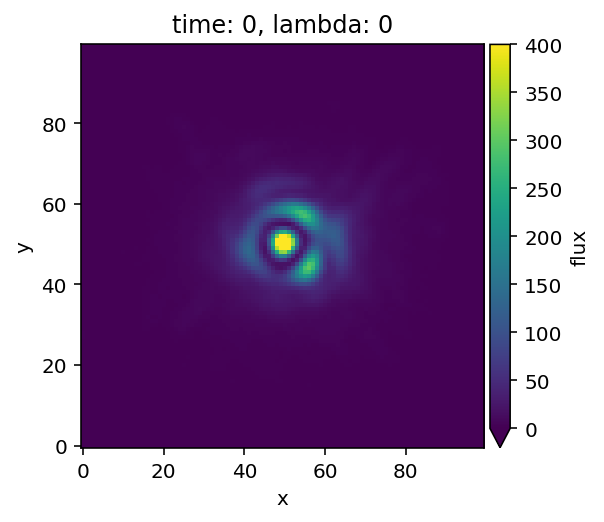

In [7]:
# Let's visualize the cube
plot_cubes(cube_crop_frames(cube,100), dynamic=False, vmin=0, vmax=400)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Dataset   [x,y,time,lambda]   (flux)
:Cube_shape	[64, 64, 5, 2]


:HoloMap   [time,lambda]
   :Image   [x,y]   (flux)
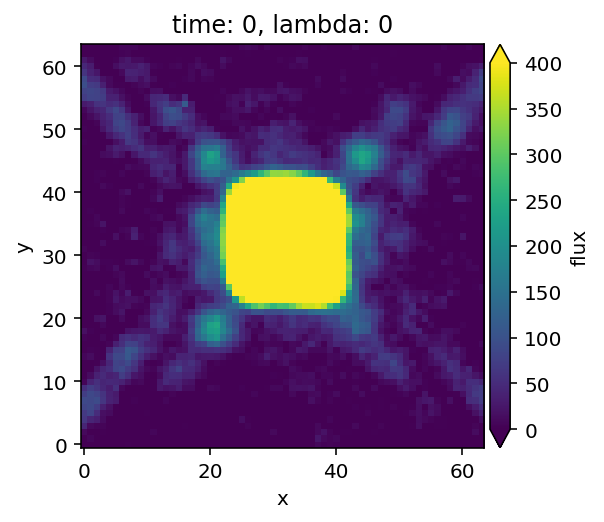
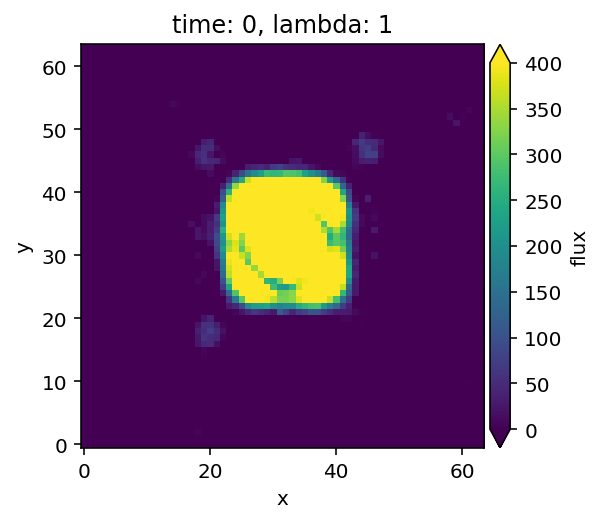
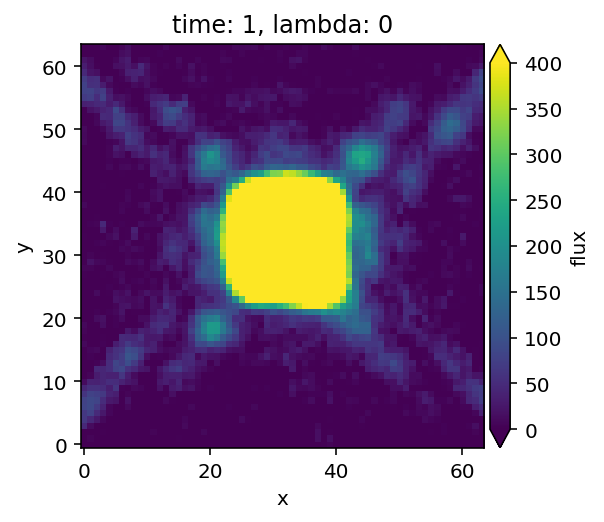
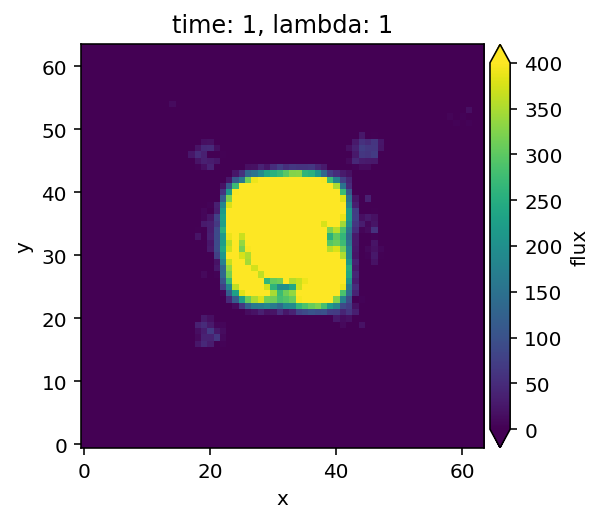
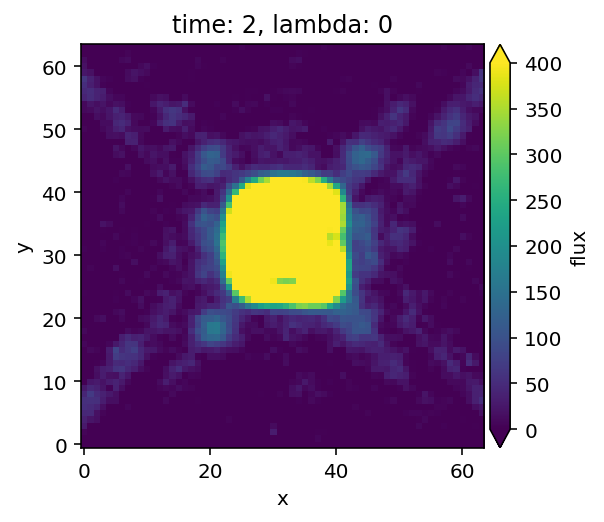
...
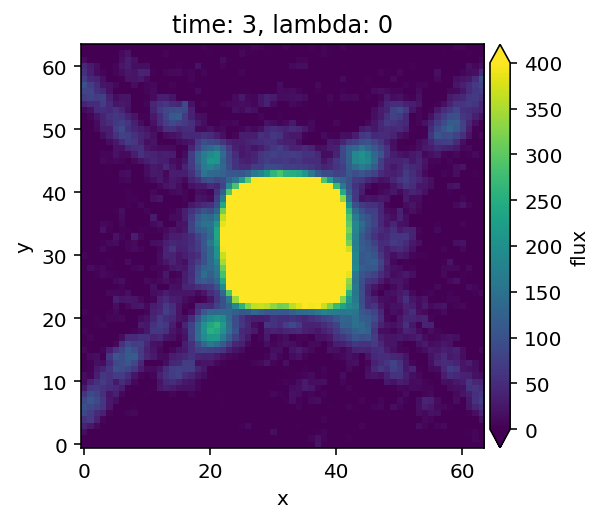
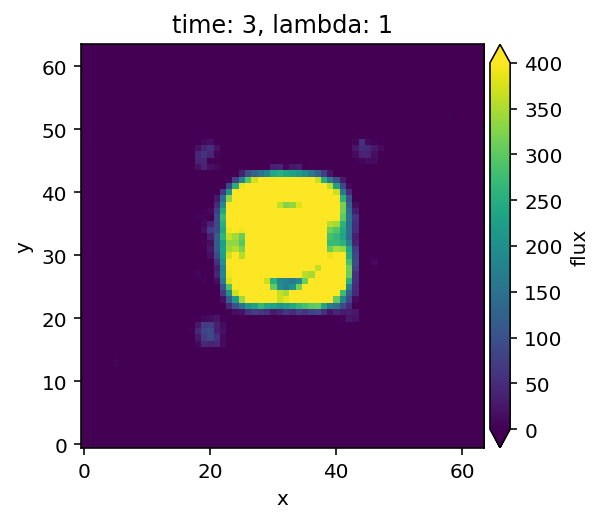
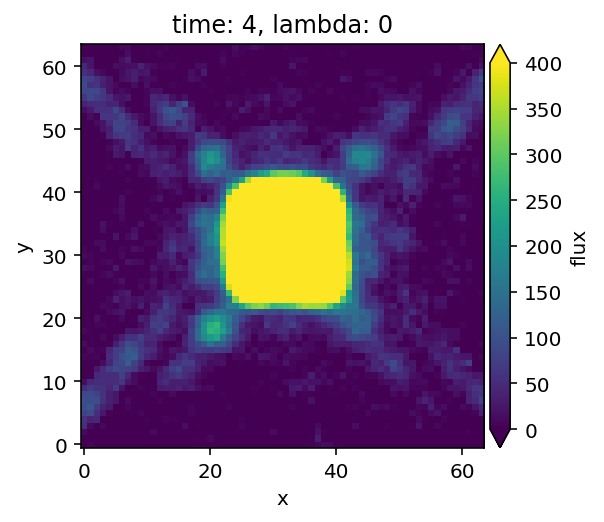
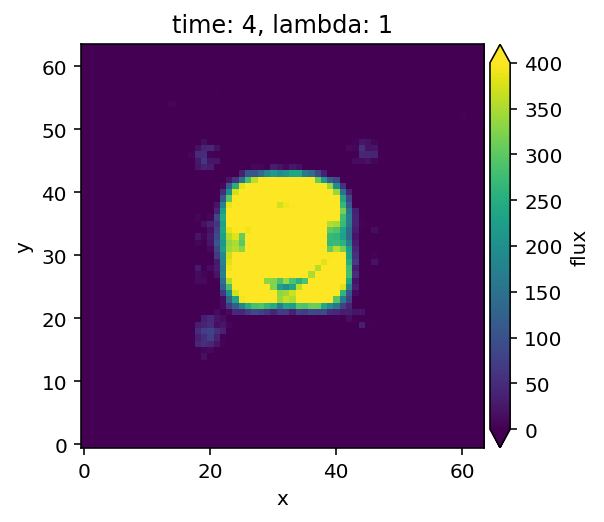
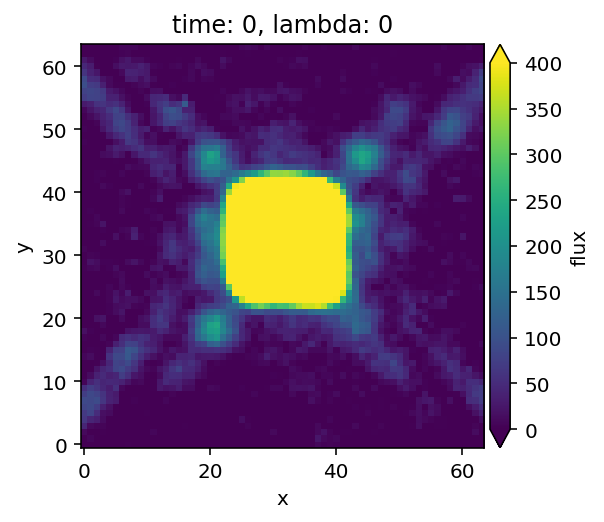

In [9]:
# Let's visualize the PSF
plot_cubes(psf, dynamic=False, vmin=0, vmax=400)

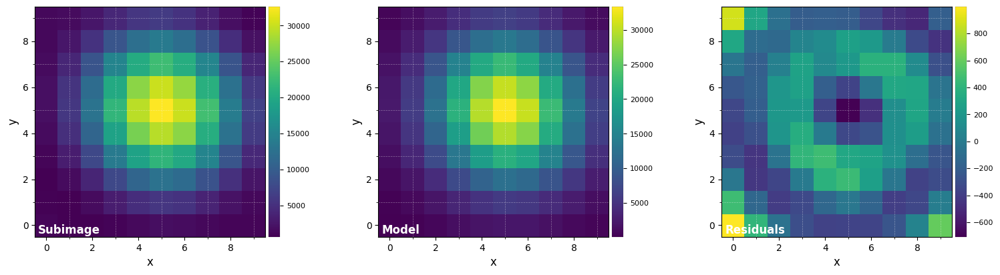

FWHM_y = 5.059103915671366
FWHM_x = 5.256553442859861 

centroid y = 32.063358384209046
centroid x = 32.07111407369198
centroid y subim = 5.063358384209048
centroid x subim = 5.071114073691982 

amplitude = 33385.36333190134
theta = -33.56556332668014


In [7]:
# Let’s measure the Full-Width Half-Maximum (FWHM) by fitting a 2D Gaussian to the core of the unsaturated non-coronagraphic PSF.
%matplotlib inline
DF_fit_K1 = fit_2dgaussian(psf[0,0,:,:], crop=True, cropsize=10, debug=True, full_output=True)

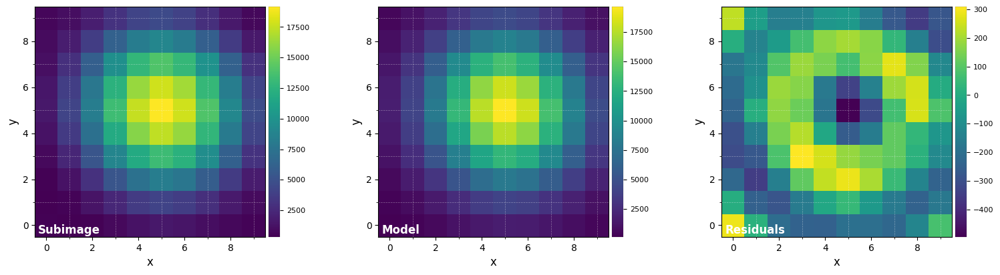

FWHM_y = 5.5104347440399515
FWHM_x = 5.356480278152726 

centroid y = 32.08024906545951
centroid x = 32.0708619028157
centroid y subim = 5.0802490654595145
centroid x subim = 5.0708619028156985 

amplitude = 19687.97511362439
theta = -310.92919903886366


In [8]:
DF_fit_K2 = fit_2dgaussian(psf[1,0,:,:], crop=True, cropsize=10, debug=True, full_output=True)

In [9]:
fwhm_sphere_K1 = np.mean([DF_fit_K1['fwhm_x'],DF_fit_K1['fwhm_y']])
print(fwhm_sphere_K1)

5.157828679265613


In [10]:
fwhm_sphere_K2 = np.mean([DF_fit_K2['fwhm_x'],DF_fit_K2['fwhm_y']])
print(fwhm_sphere_K2)

5.433457511096339


In [11]:
# Let's normalize the flux to one in a 1xFWHM aperture and crop the PSF array
psfn_K1 = normalize_psf(psf[0,0,:,:], fwhm_sphere_K1, size=19, imlib='ndimage-fourier')

Flux in 1xFWHM aperture: 500880.322


In [12]:
psfn_K2 = normalize_psf(psf[1,0,:,:], fwhm_sphere_K2, size=19, imlib='ndimage-fourier')

Flux in 1xFWHM aperture: 327218.705


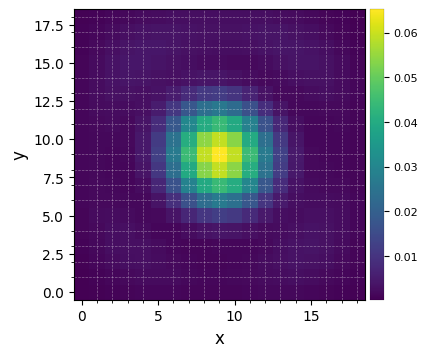

In [13]:
# Let's visualize the normalized PSF
plot_frames(psfn_K1, grid=True, size_factor=4)

## Pre-processing

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-11-26 19:29:39
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
2d gauss-fitting
Running time:  0:00:02.606346
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


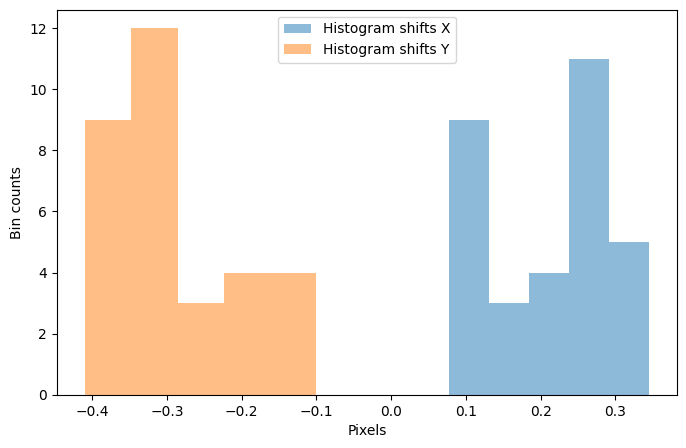

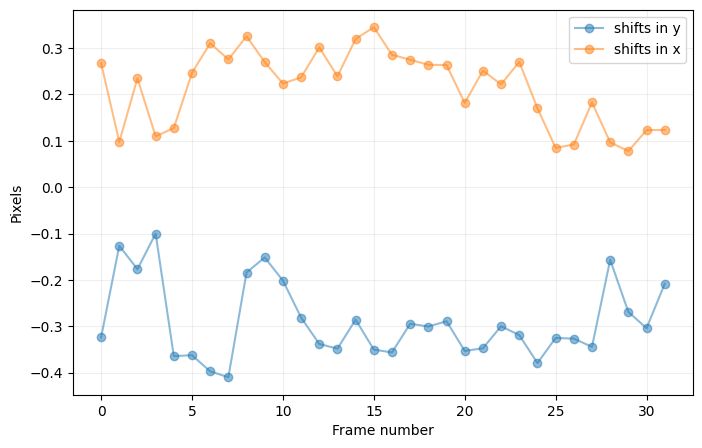

In [39]:
cube_K1, shy_K1, shx_K1 = cube_recenter_2dfit(cube[0,:,:,:], xy=(512, 512), fwhm=fwhm_sphere_K1, nproc=1, subi_size=6,
                                        model='gauss', negative=False, full_output=True, debug=False,
                                        imlib='vip-fft')

New shape: (10, 10)
New shape: (10, 10)


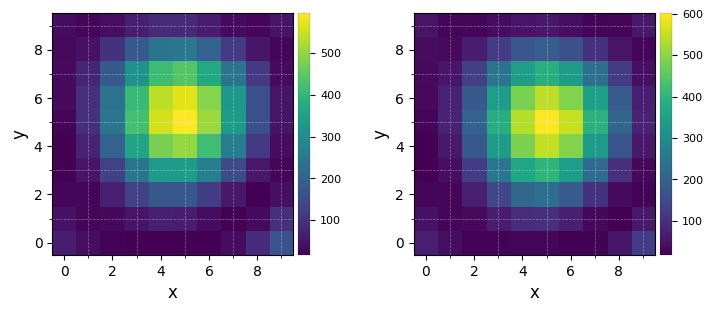

In [42]:
plot_frames((frame_crop(cube[0,0,:,:], 10),frame_crop(cube_K1[0], 10)), grid=True, size_factor=4)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-11-26 19:34:33
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
2d gauss-fitting
Running time:  0:00:06.219764
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


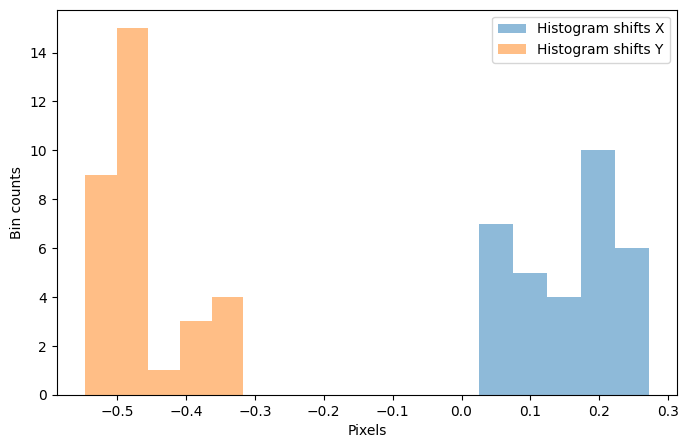

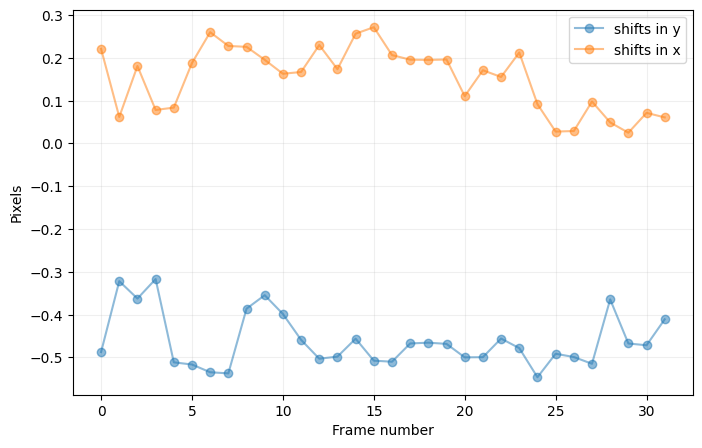

In [45]:
cube_K2, shy_K2, shx_K2 = cube_recenter_2dfit(cube[1,:,:,:], xy=(512, 512), fwhm=fwhm_sphere_K2, nproc=1, subi_size=6,
                                        model='gauss', negative=False, full_output=True, debug=False,
                                        imlib='vip-fft')

New shape: (10, 10)
New shape: (10, 10)


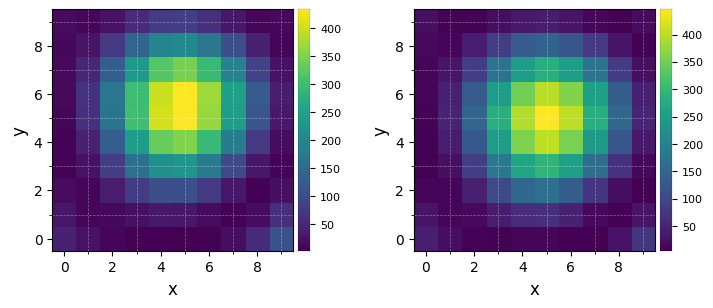

In [46]:
plot_frames((frame_crop(cube[1,0,:,:], 10),frame_crop(cube_K2[0], 10)), grid=True, size_factor=4)

## Model PSF subtraction for ADI

In [47]:
# We set the preferred method to be used for image rotation.
imlib = 'vip-fft'
interpolation = None

### Median-ADI

This method model the PSF with the median of the ADI sequence, subtract it, then derotate and median-combine all residual images.

In [48]:
fr_adi_K1 = median_sub(cube_K1, angle, mode='fullfr', imlib=imlib, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-11-26 19:35:06
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Median psf reference subtracted
Done derotating and combining
Running time:  0:06:27.979466
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [49]:
fr_adi_K2 = median_sub(cube_K2, angle, mode='fullfr', imlib=imlib, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-11-26 19:41:34
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Median psf reference subtracted
Done derotating and combining
Running time:  0:05:04.593632
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


New shape: (210, 210)


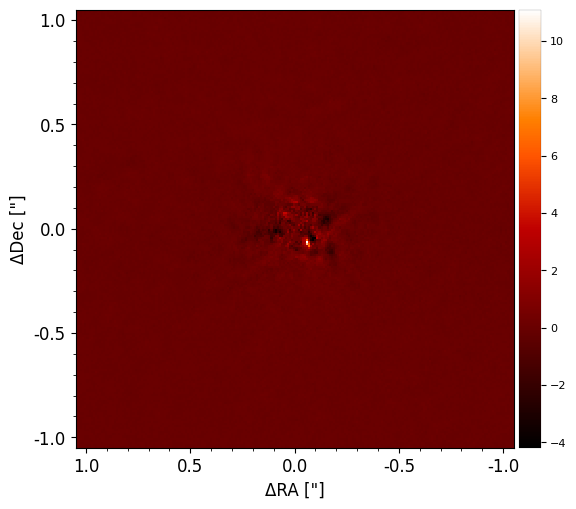

In [68]:
plot_frames(frame_crop(fr_adi_K1, 210), backend='matplotlib', ang_scale=True, cmap = 'gist_heat')

New shape: (210, 210)


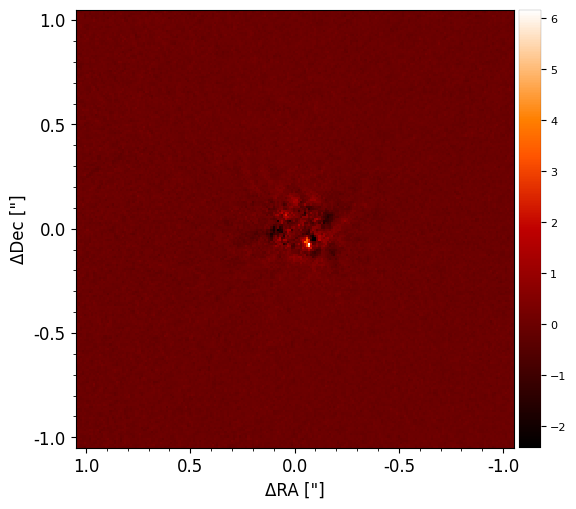

In [69]:
plot_frames(frame_crop(fr_adi_K2, 210), backend='matplotlib', ang_scale=True, cmap = 'gist_heat')

In [50]:
# Let's save the resulting arrays
#np.savetxt('AS209_fr_median_K1_ADI_2021-04-06', fr_adi_K1)
#np.savetxt('AS209_fr_median_K2_ADI_2021-04-06', fr_adi_K2)

In [51]:
from numpy import loadtxt

fr_adi_K1 = loadtxt('AS209_fr_median_K1_ADI_2021-04-06')
fr_adi_K2 = loadtxt('AS209_fr_median_K2_ADI_2021-04-06')

### Full-frame PCA (ADI+SDI)

In [52]:
cube_K12 = np.stack((cube_K1, cube_K2), axis=0)

In [53]:
np.shape(cube_K12)

(2, 32, 1024, 1024)

In [59]:
fr_pca = pca(cube_K12, angle, ncomp=5, mask_center_px=None, imlib=imlib, interpolation=interpolation,
              svd_mode='lapack')

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-11-26 19:51:04
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 134.824 GB
System available memory = 93.237 GB
Done vectorizing the frames. Matrix shape: (32, 1048576)
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:02.107492
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done de-rotating and combining
Running time:  0:05:58.949046
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done vectorizing the frames. Matrix shape: (32, 1048576)
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:06:00.957388
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done de-rotating and combining
Running time:  0:10:26.286817
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


New shape: (210, 210)


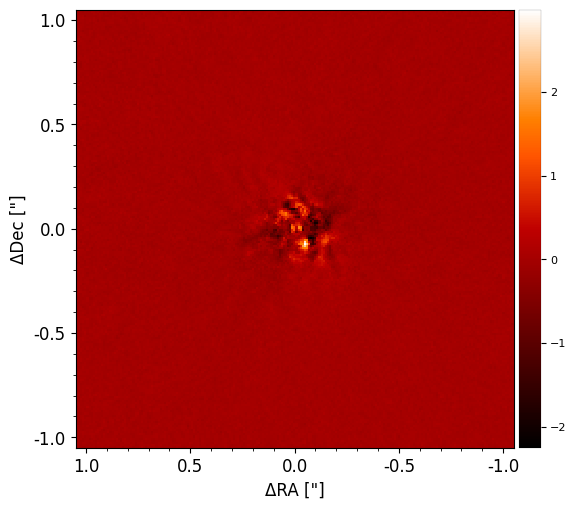

In [70]:
plot_frames((frame_crop(fr_pca, 210)), backend='matplotlib', ang_scale=True, cmap = 'gist_heat')

In [63]:
# Let's save the resulting array
#np.savetxt('AS209_fr_pca_ADI_2021-04-06', fr_pca)

In [64]:
fr_pca = loadtxt('AS209_fr_pca_ADI_2021-04-06')

## Plotting the disk structures  

In [22]:
from astropy.visualization import (AsinhStretch, LinearStretch, LogStretch, ImageNormalize)
from matplotlib.patches import Ellipse
import matplotlib.gridspec as gridspec
import scipy.ndimage
from matplotlib.offsetbox import AnchoredOffsetbox, AuxTransformBox, DrawingArea, TextArea, VPacker
from matplotlib.patches import Rectangle

In [23]:
fig = plt.figure(figsize=(10, 9))
gs  = gridspec.GridSpec(2, 2, figure = fig, width_ratios=(1, 1), height_ratios=(1, 1))
norm = ImageNormalize(vmin=-5,vmax=5, stretch=LinearStretch())
fig_size = 1.2

<Figure size 1000x900 with 0 Axes>

In [24]:
aoff, doff = 0,0 #-0.89,0.9
RA_CO  = -12.25e-3 * (np.arange(cubee[0].header['NAXIS1'])-(512.512))
DEC_CO = 12.25e-3 * (np.arange(cubee[0].header['NAXIS2'])-(512.512))
ext_CO = (np.max(RA_CO)-aoff, np.min(RA_CO)-aoff, np.min(DEC_CO)-doff, np.max(DEC_CO)-doff)

In [25]:
def mk_ellipse(x0,y0,R,incl,PA, npts=200):
    phi = 2.*np.pi*np.arange(npts)/(npts-1.)
    incl_rad = incl * np.pi/180.
    PA_rad = (PA) * np.pi/180.
    xell = R*np.cos(phi)*np.cos(incl_rad)
    yell = R*np.sin(phi)
    xrot = ( (xell)*np.cos(PA_rad) + (yell)*np.sin(PA_rad) ) + x0
    yrot = (-(xell)*np.sin(PA_rad) + (yell)*np.cos(PA_rad) ) + y0
    return [xrot, yrot]

In [26]:
#gap radius, offsets,inclination and position angle
g1 = 503e-3
x0g1, y0g1 = -2e-3, -4e-3
ig1 = 35.8
PAg1 = 86.1

g2 = 872e-3
x0g2, y0g2 = 1e-3, 0e-3
ig2 = 35
PAg2 = 85.6

#ring radius, offsets,inclination and position angle
r1 = 992.9e-3
x0r1, y0r1 = -0.8e-3, -4.4e-3 # consider this as outer disk offsets
ir1 = 34.92
PAr1 = 85.7

r2 = 612.8e-3
x0r2, y0r2 = 0.2e-3, 2.1e-3 # consider this as outer disk offsets
ir2 = 34.92
PAr2 = 85.6

In [27]:
#gap ellipse
xg1, yg1 = mk_ellipse(x0g1,y0g1,g1,ig1,PAg1,5000)
xg2, yg2 = mk_ellipse(x0g2,y0g2,g2,ig2,PAg2,5000)
xr1, yr1 = mk_ellipse(x0r1,y0r1,r1,ir1,PAr1,500)
xr2, yr2 = mk_ellipse(x0r2,y0r2,r2,ir2,PAr2,500)

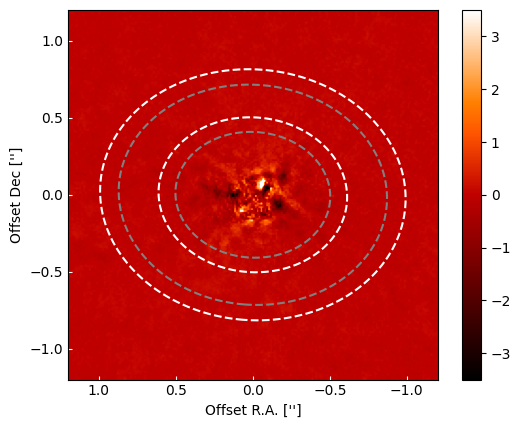

In [65]:
ax1 = fig.add_subplot(gs[0,0])
masked_array = np.ma.array(fr_adi_K1, mask=np.isnan(fr_adi_K1))
im1 = plt.imshow(masked_array, extent=ext_CO, cmap='gist_heat', vmax=3.5, vmin=-3.5)
plt.xlim([fig_size,-fig_size])
plt.ylim([-fig_size,fig_size])
plt.xlabel("Offset R.A. ['']")
plt.ylabel("Offset Dec ['']")
plt.tick_params('both', length=3, direction='in', which='major', color='white',labelcolor='k')
#plt.title('AS209 (band K1)', fontsize='x-large')
#plt.yticks([-1.0,- 0.5, 0.0, 0.5, 1.0])
#plt.xticks([1.5, 1.0, 0.5, 0.0, -0.5, -1.0, -1.5])
plt.plot(xr1-x0r1,yr1-y0r1,'w--')
plt.plot(xg1-x0g1,yg1-y0g1,'--', color='0.5')
plt.plot(xr2-x0r2,yr2-y0r2,'w--')
plt.plot(xg2-x0g2,yg2-y0g2,'--', color='0.5')
plt.colorbar()
plt.show()



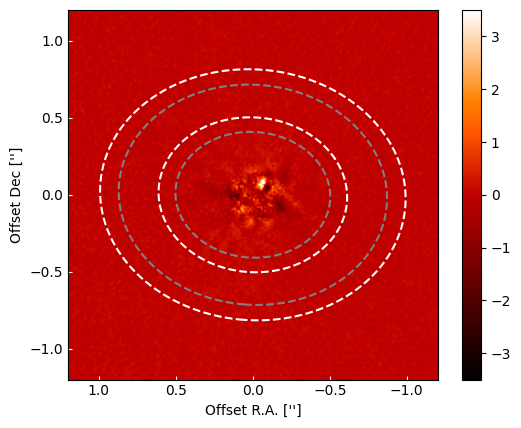

In [66]:
ax2 = fig.add_subplot(gs[0,0])
masked_array2 = np.ma.array(fr_adi_K2, mask=np.isnan(fr_adi_K2))
im2 = plt.imshow(masked_array2, extent=ext_CO, cmap = 'gist_heat', vmax=3.5, vmin=-3.5)
plt.xlim([fig_size,-fig_size])
plt.ylim([-fig_size,fig_size])
plt.xlabel("Offset R.A. ['']")
plt.ylabel("Offset Dec ['']")
plt.tick_params('both', length=3, direction='in', which='major', color='white',labelcolor='k')
#plt.title('AS209 (band K1)', fontsize='x-large')
#plt.yticks([-1.0,- 0.5, 0.0, 0.5, 1.0])
#plt.xticks([1.5, 1.0, 0.5, 0.0, -0.5, -1.0, -1.5])
plt.plot(xr1-x0r1,yr1-y0r1,'w--')
plt.plot(xg1-x0g1,yg1-y0g1,'--', color='0.5')
plt.plot(xr2-x0r2,yr2-y0r2,'w--')
plt.plot(xg2-x0g2,yg2-y0g2,'--', color='0.5')
plt.colorbar()
plt.show()

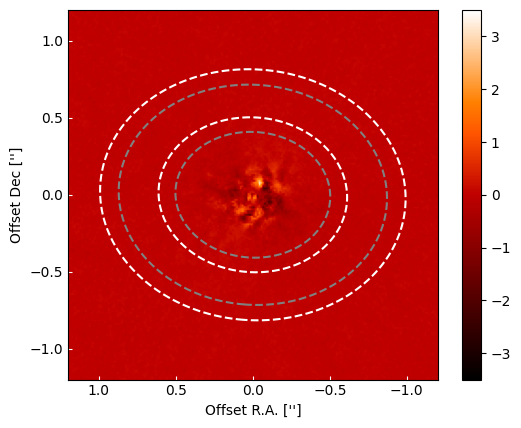

In [67]:
ax3 = fig.add_subplot(gs[0,0])
masked_array3 = np.ma.array(fr_pca, mask=np.isnan(fr_pca))
im3 = plt.imshow(masked_array3, extent=ext_CO, cmap = 'gist_heat', vmax=3.5, vmin=-3.5)
plt.xlim([fig_size,-fig_size])
plt.ylim([-fig_size,fig_size])
plt.xlabel("Offset R.A. ['']")
plt.ylabel("Offset Dec ['']")
plt.tick_params('both', length=3, direction='in', which='major', color='white',labelcolor='k')
#plt.title('AS209 (band K1)', fontsize='x-large')
#plt.yticks([-1.0,- 0.5, 0.0, 0.5, 1.0])
#plt.xticks([1.5, 1.0, 0.5, 0.0, -0.5, -1.0, -1.5])
plt.plot(xr1-x0r1,yr1-y0r1,'w--')
plt.plot(xg1-x0g1,yg1-y0g1,'--', color='0.5')
plt.plot(xr2-x0r2,yr2-y0r2,'w--')
plt.plot(xg2-x0g2,yg2-y0g2,'--', color='0.5')
plt.colorbar()
plt.show()

## Throughput and contrast curves

### Throughput

In [15]:
res_thr_median = throughput(cube[0,:,:,:], angle, psfn, fwhm_sphere,
                            algo=median_sub, nbranch=1, full_output=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-09-01 23:29:42
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


Cube without fake companions processed with median_sub
Running time:  0:04:52.195487
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Measured annulus-wise noise in resulting frame
Running time:  0:04:53.371783
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Flux in 1xFWHM aperture: 1.000
Fake companions injected in branch 1 (pattern 1/3)
Running time:  0:05:11.070044
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Cube with fake companions processed with median_sub
Measuring its annulus-wise throughput
Running time:  0:10:06.079405
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Fake companions injected in branch 1 (pattern 2/3)
Running time:  0:10:23.777642
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Cube with fake companions processed with median_sub
Measuring its annulus-wise throughput
Running time:  0:15:18.746113


In [ ]:
res_thr_pca = throughput(cube, angle, psfn, fwhm_sphere, ncomp=15,
                         algo=pca, nbranch=1, full_output=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-08-09 15:31:43
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


Cube without fake companions processed with pca
Running time:  0:04:18.096084
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Measured annulus-wise noise in resulting frame
Running time:  0:04:19.013480
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Flux in 1xFWHM aperture: 1.000
Fake companions injected in branch 1 (pattern 1/3)
Running time:  0:04:37.653439
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Cube with fake companions processed with pca
Measuring its annulus-wise throughput
Running time:  0:08:51.023024
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Fake companions injected in branch 1 (pattern 2/3)
Running time:  0:09:10.227018
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Cube with fake companions processed with pca
Measuring its annulus-wise throughput
Running time:  0:13:25.902326
―――――――――――――――――――――

In [16]:
figure(figsize=(6,3))
plot(res_thr_pca[3], res_thr_pca[0][0,:], 'o-', alpha=0.5)
ylabel('Throughput')
xlabel('Separation in pixels')

NameError: name 'res_thr_pca' is not defined

<Figure size 600x300 with 0 Axes>

NameError: name 'res_thr_pca' is not defined

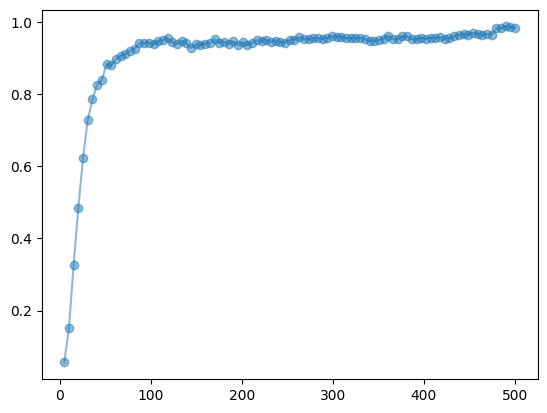

In [17]:
#figure(figsize=(10,7))
plot(res_thr_median[3], res_thr_median[0][0,:], 'o-', alpha=0.5, label = 'Median')
plot(res_thr_pca[3], res_thr_pca[0][0,:], 'o-', alpha=0.5, label = 'Full-frame PCA')
ylabel('Throughput')
xlabel('Separation in pixels')
plt.legend()

Text(0.5, 0, 'Separation in pixels')

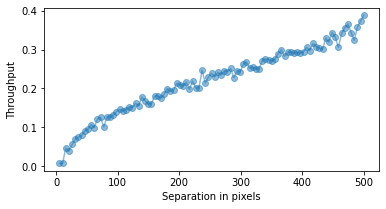

In [ ]:
figure(figsize=(6,3))
plot(res_thr_pca[3], res_thr_pca[0][0,:], 'o-', alpha=0.5, label = 'Full-frame PCA')
ylabel('Throughput')
xlabel('Separation in pixels')

Let’s compare this with the annular PCA result:

In [ ]:
res_thr2 = throughput(cube, angle, psfn, fwhm_sphere, algo=pca_annular, nbranch=1, verbose=False,
                      full_output=True, ncomp=10, radius_int=int(fwhm_sphere))

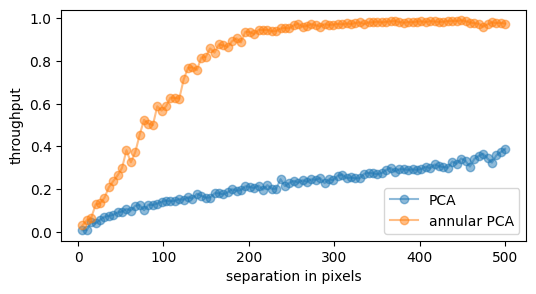

In [ ]:
figure(figsize=(6,3))
plot(res_thr[3], res_thr[0][0,:], 'o-', label='PCA', alpha=0.5)
plot(res_thr2[3], res_thr2[0][0,:], 'o-', label='annular PCA', alpha=0.5)
ylabel('throughput')
xlabel('separation in pixels')
_ = legend(loc='best')

### Contrast curves

In [ ]:
nsig=5

In [ ]:
starphot = 500880.322

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-05-11 00:02:44
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
ALGO : pca, FWHM = 5.157828679265613, # BRANCHES = 1, SIGMA = 5, STARPHOT = 500880.322
Finished the throughput calculation
Running time:  0:23:16.334077
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


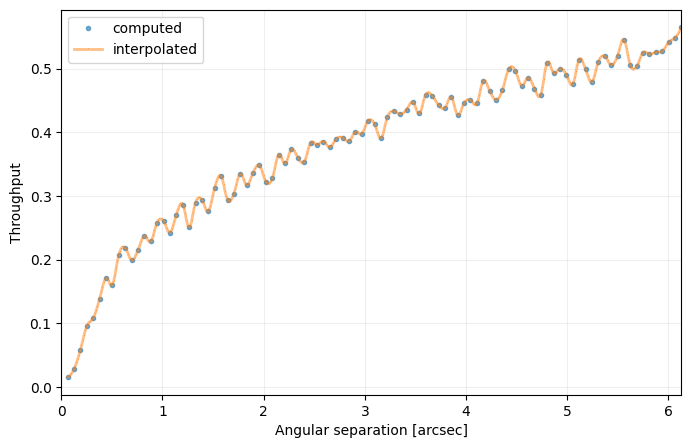

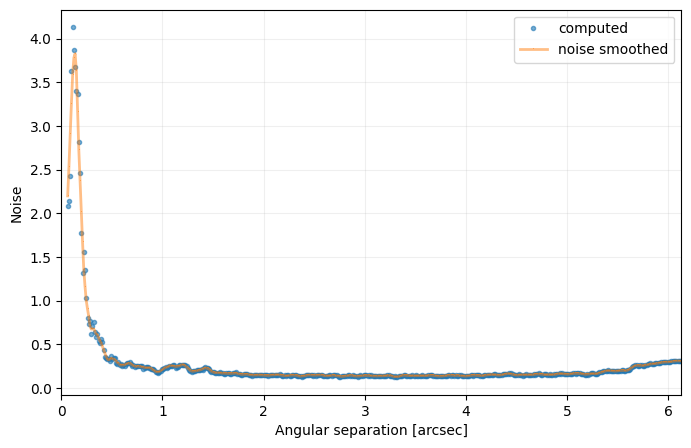

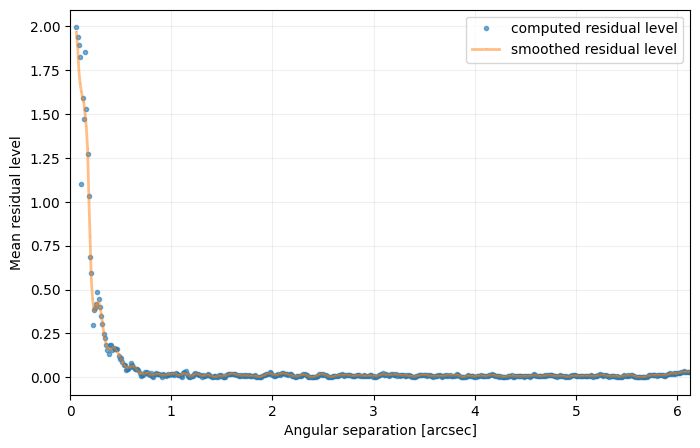

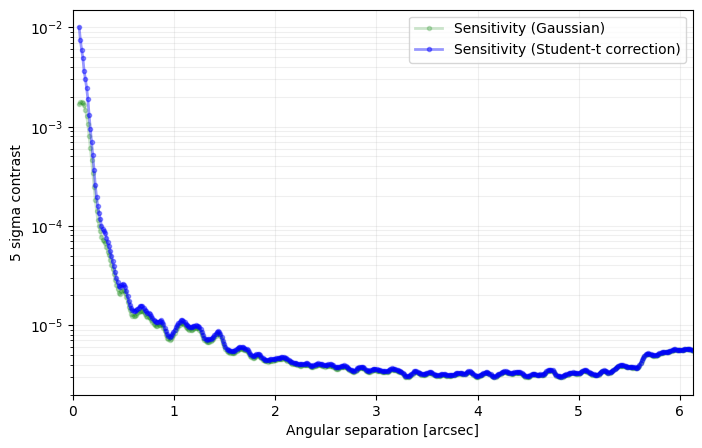

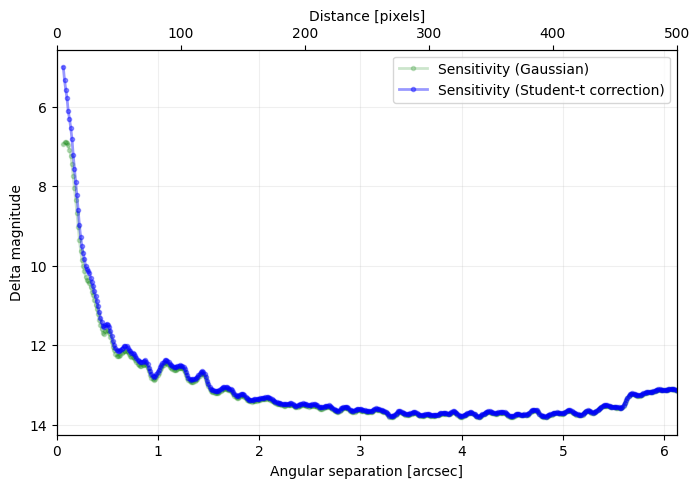

In [ ]:
cc_1 = contrast_curve(cube, angle, psfn, fwhm=fwhm_sphere, pxscale=pxscale_sphere, starphot=starphot,
                      sigma=nsig, nbranch=1, algo=pca, ncomp=9, debug=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-05-10 22:47:35
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
ALGO : pca_annular, FWHM = 5.157828679265613, # BRANCHES = 1, SIGMA = 5, STARPHOT = 500880.322
Finished the throughput calculation
Running time:  0:35:22.228842
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


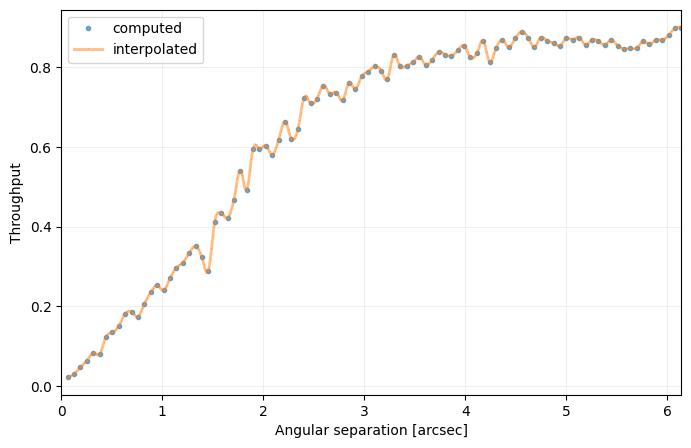

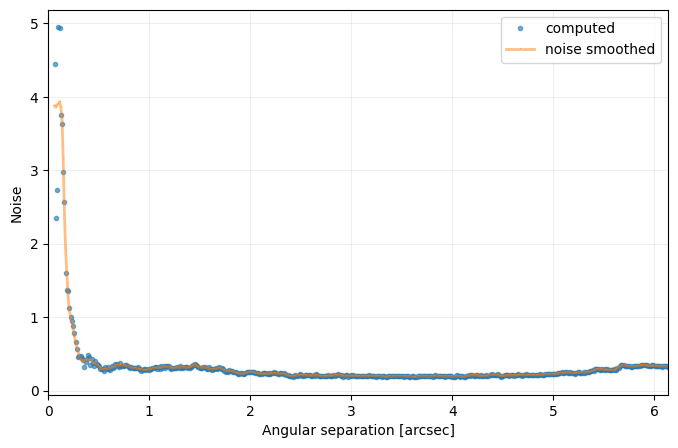

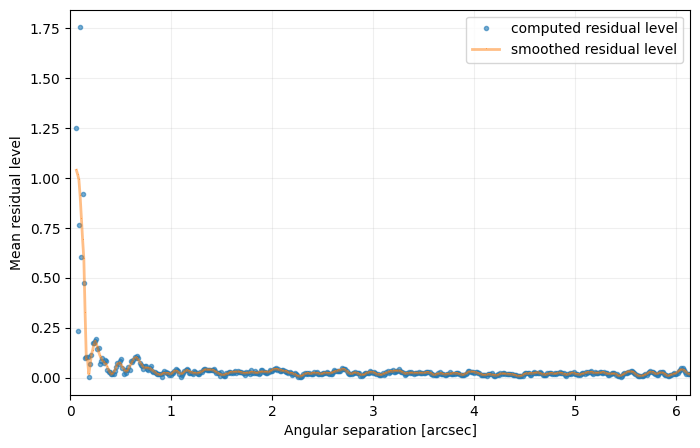

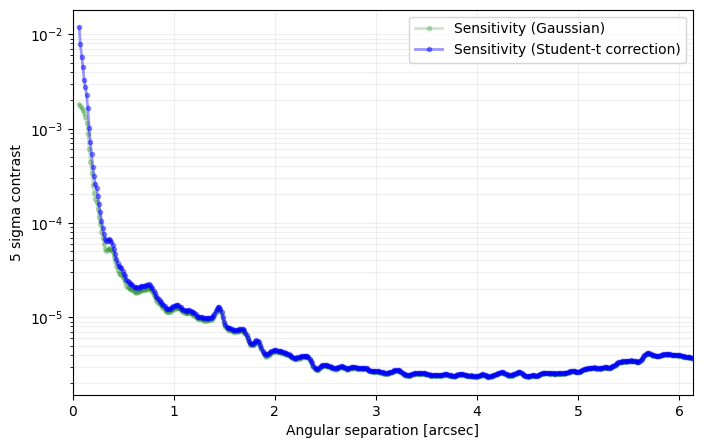

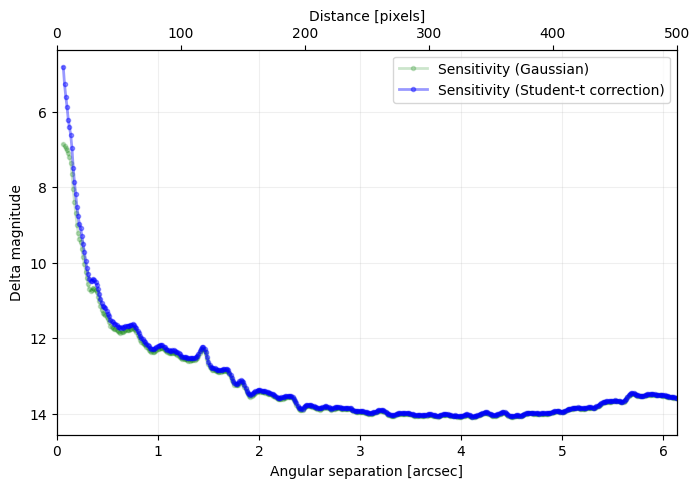

In [ ]:
cc_2 = contrast_curve(cube, angle, psfn, fwhm=fwhm_sphere, pxscale=pxscale_sphere, starphot=starphot,
                      sigma=nsig, nbranch=1, delta_rot=0.01, algo=pca_annular, ncomp=9, debug=True)

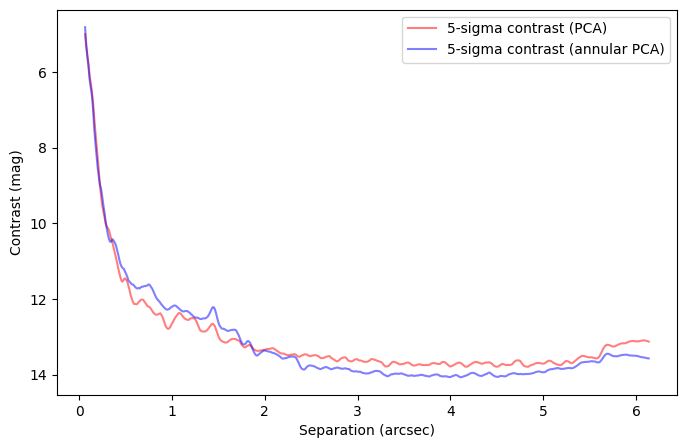

In [ ]:
figure(figsize=(8,5))
plt.plot(cc_1['distance']*pxscale_sphere,
         -2.5*np.log10(cc_1['sensitivity_student']),
         'r-', label='{}-sigma contrast (PCA)'.format(nsig), alpha=0.5)
plt.plot(cc_2['distance']*pxscale_sphere,
         -2.5*np.log10(cc_2['sensitivity_student']),
         'b-', label='{}-sigma contrast (annular PCA)'.format(nsig), alpha=0.5)
plt.gca().invert_yaxis()
ylabel('Contrast (mag)')
xlabel('Separation (arcsec)')
_ = legend(loc='best')
plt.show()

### Injecting fake planets

In [ ]:
imlib2 = 'opencv'
interpolation2='lanczos4' #'biquintic'

In [ ]:
rad_fc = 10
theta_fc = 150
flux_fc = 400.

gt = [rad_fc, theta_fc, flux_fc]

In [ ]:
cubefc = cube_inject_companions(cube, psf_template=psfn, angle_list=angle, flevel=flux_fc, plsc=pxscale_sphere,
                                rad_dists=[rad_fc], theta=theta_fc, n_branches=1,
                                imlib=imlib2, interpolation=interpolation2)

New shape: (32, 100, 100)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Dataset   [x,y,time]   (flux)
:Cube_shape	[100, 100, 32]


:HoloMap   [time]
   :Image   [x,y]   (flux)
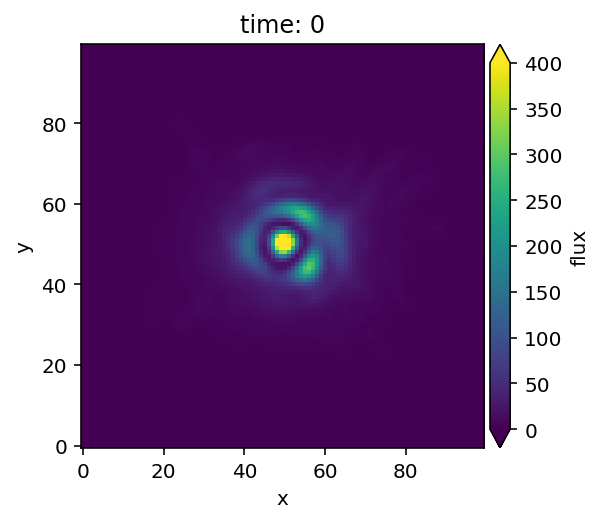
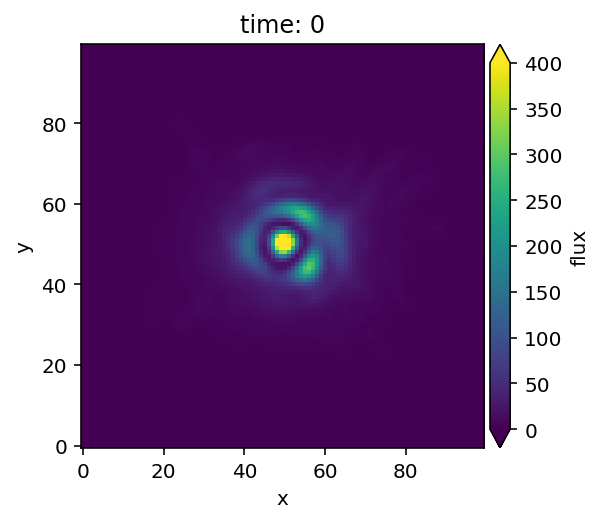
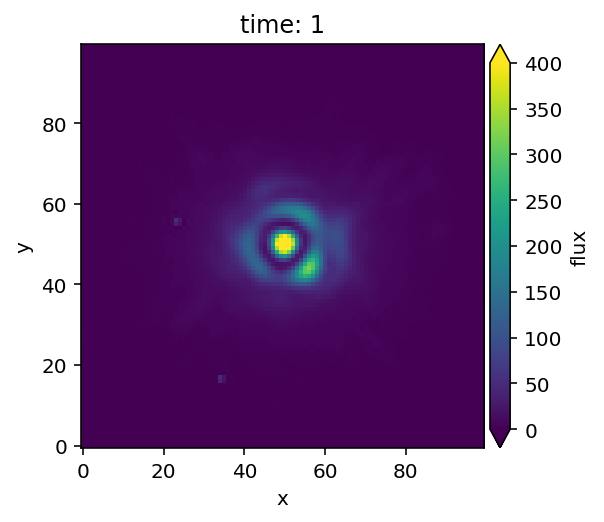
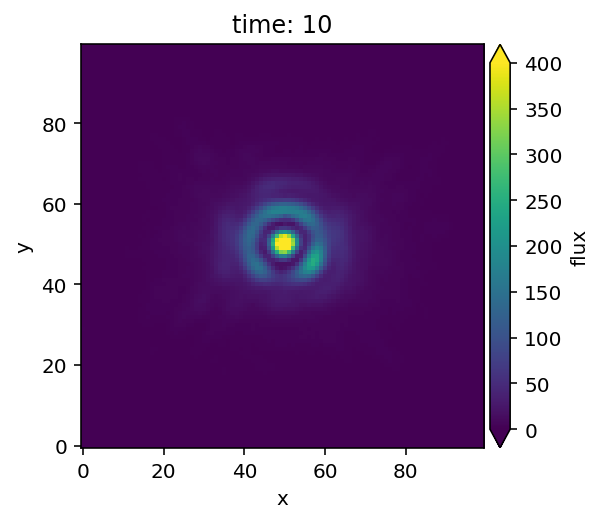
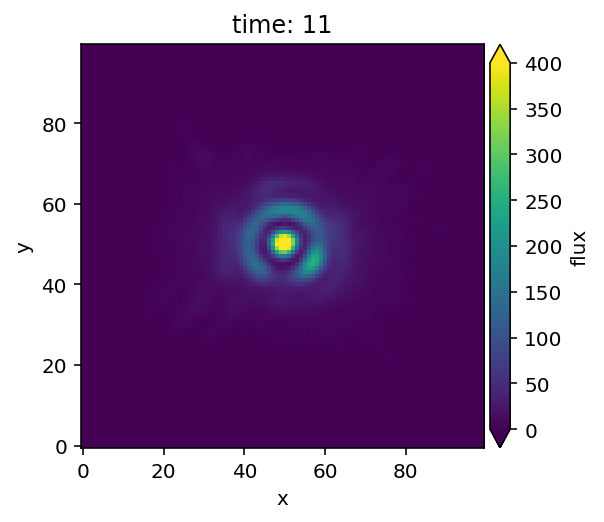
...
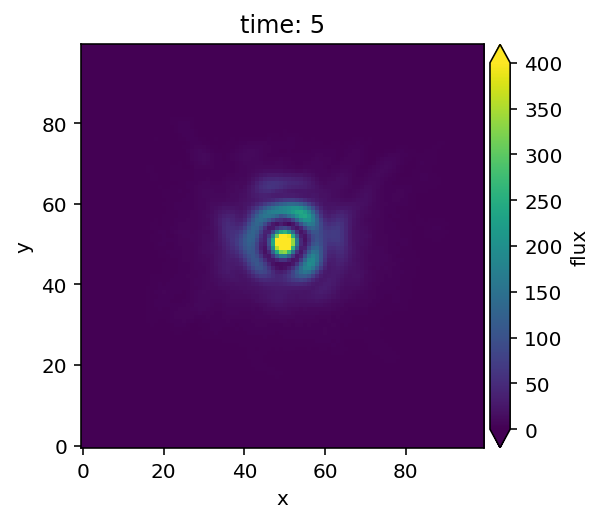
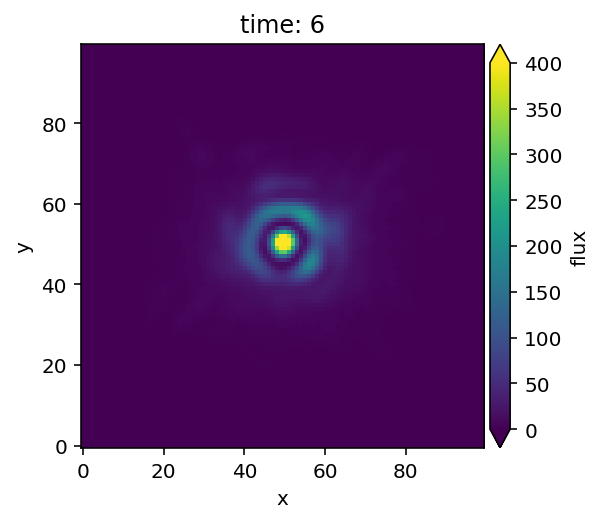
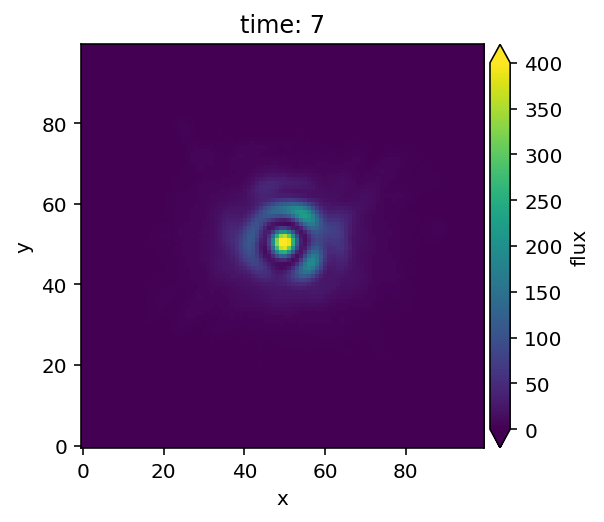
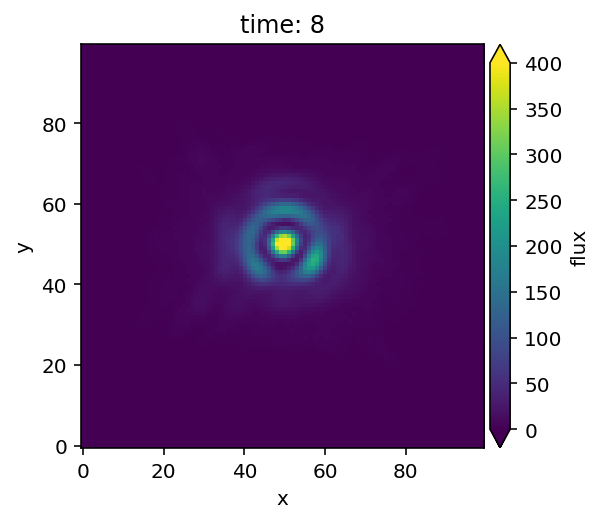
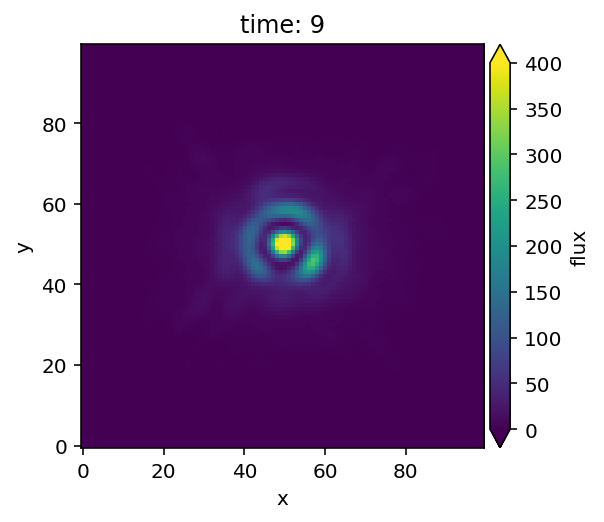

In [ ]:
# Let's visualize the cube with the fake planet
plot_cubes(cube_crop_frames(cubefc,100), dynamic=False, vmin=0, vmax=400)

In [ ]:
fr_pca2 = pca(cubefc, angle, ncomp=10, mask_center_px=None, imlib=imlib, interpolation=interpolation,
              svd_mode='lapack')

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-06-19 14:43:19
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 134.824 GB
System available memory = 86.045 GB
Done vectorizing the frames. Matrix shape: (32, 1048576)
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:02.361203
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done de-rotating and combining
Running time:  0:03:53.270219
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


New shape: (110, 110)


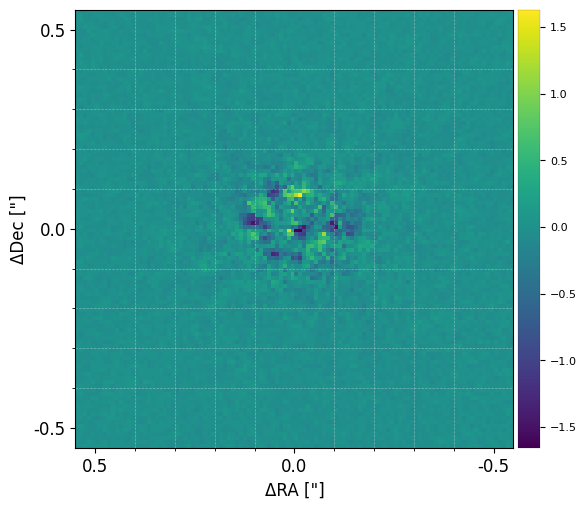

In [ ]:
%matplotlib inline 
plot_frames((frame_crop(fr_pca2, 110)), backend='matplotlib', ang_scale=True, grid=True)

In [ ]:
cy, cx = frame_center(cube[0])
x_fc = cx + rad_fc*np.cos(np.deg2rad(theta_fc))
y_fc = cy + rad_fc*np.sin(np.deg2rad(theta_fc))

xy_test = (x_fc, y_fc)
print('({:.1f}, {:.1f})'.format(xy_test[0],xy_test[1]))

(503.3, 517.0)


――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-06-19 14:47:39
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:01.947741
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Number of steps 16
Optimal number of PCs = 15, for S/N=3.471
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Coords of chosen px (X,Y) = 503.3, 517.0
Flux in a centered 1xFWHM circular aperture = 7.134
Central pixel S/N = 4.248
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Inside a centered 1xFWHM circular aperture:
Mean S/N (shifting the aperture center) = 3.471
Max S/N (shifting the aperture center) = 7.616
stddev S/N (shifting the aperture center) = 1.114



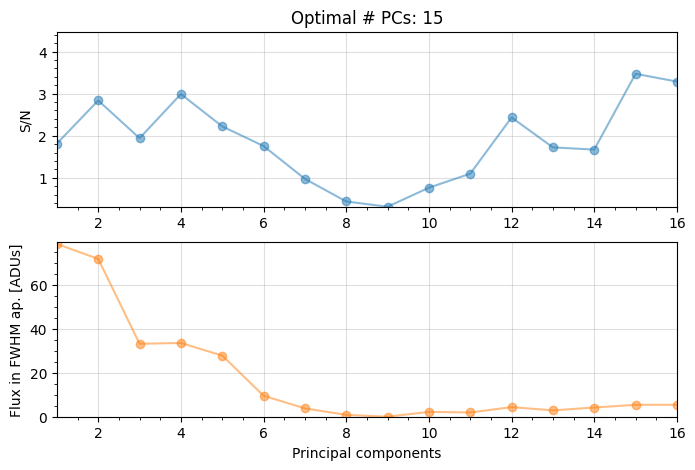

In [ ]:
res_opt = pca_grid(cubefc, angle, fwhm=fwhm_sphere, range_pcs=(1,16,1), source_xy=xy_test,
                   imlib=imlib2, interpolation=interpolation2, full_output=True, plot=True)

In [ ]:
_, final_opt, _, opt_npc = res_opt

New shape: (110, 110)


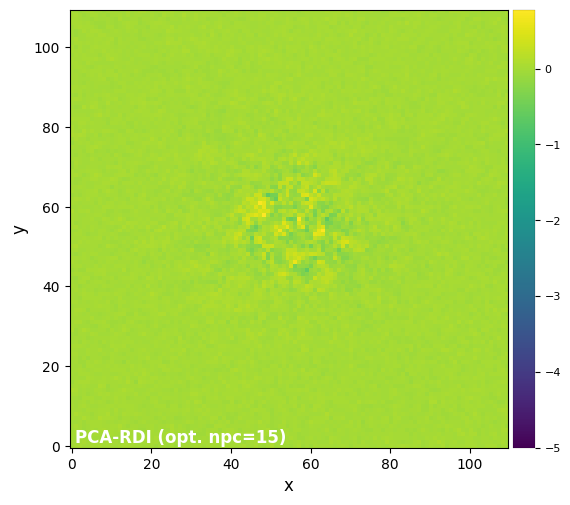

In [ ]:
%matplotlib inline
plot_frames(frame_crop(final_opt, 110), label='PCA-RDI (opt. npc={:.0f})'.format(opt_npc),
            dpi=100, vmin=-5, colorbar=True, circle=xy_test)

Now let's check how good is the sustraction by characterizing the planets.

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-06-19 14:49:15
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
             Planet 0           
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――

Planet 0: flux estimation at the position [503.33974596215563,517.0], running ...
Step | flux    | chi2r
1/30   0.100   0.110
2/30   0.149   0.110
3/30   0.221   0.110
4/30   0.329   0.110
5/30   0.489   0.110
6/30   0.728   0.110
7/30   1.083   0.110
8/30   1.610   0.110


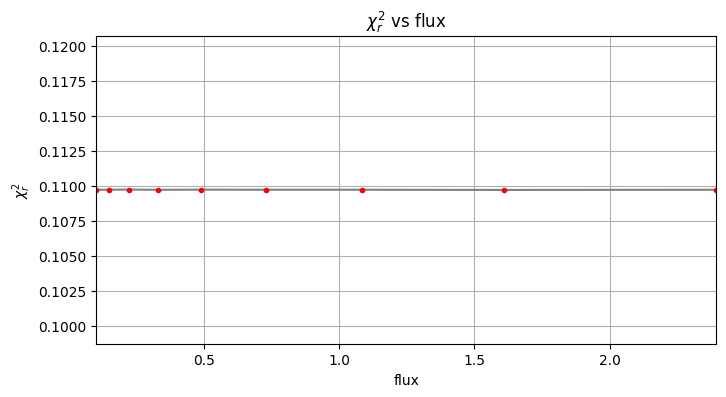

Planet 0: preliminary position guess: (r, theta)=(10.0, 150.0)
Planet 0: preliminary flux guess: 1.6
Planet 0: Simplex Nelder-Mead minimization, running ...
Planet 0: Success: True, nit: 62, nfev: 155, chi2r: 0.10928568968901763
message: Optimization terminated successfully.
Planet 0: simplex result: (r, theta, f)=(9.875, 136.229, 1.625) at 
          (X,Y)=(504.87, 518.83)

 ―――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――― 
DONE !
 ――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Running time:  0:04:09.205237
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [ ]:
r_lo, theta_lo, f_lo = firstguess(cubefc, angle, psfn, ncomp=15, planets_xy_coord=[xy_test],
                                  fwhm=fwhm_sphere, f_range=None, simplex=True, imlib=imlib2,
                                  interpolation=interpolation2, plot=True, verbose=True)